In [21]:

%pip install -q numpy scipy librosa soundfile pandas matplotlib speechmos pesq



Note: you may need to restart the kernel to use updated packages.


In [22]:
from dataclasses import dataclass
from typing import Optional, Tuple, Dict, Union
from scipy import signal
from speechmos import dnsmos
from IPython.display import Audio, display
from pesq import pesq
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import soundfile as sf
import librosa

In [23]:
# BPF estimated function
def estimate_bpf_welch(x: np.ndarray,fs: int,fmin: float = 20.0,fmax: float = 600.0,show_plot: bool = False) -> float:
    """Return dominant BPF in Hz from Welch PSD within [fmin,fmax]."""
    nperseg = min(len(x), max(256, int(fs * 2.0)))
    noverlap = int(0.5 * nperseg)
    freqs, psd = signal.welch(
    x, fs=fs, window="hann", nperseg=nperseg, noverlap=noverlap,
    detrend=False, return_onesided=True, scaling="spectrum",average="median"
    )
    band = (freqs >= fmin) & (freqs <= fmax)
    if not np.any(band):
        return 100.0
    sub_f = freqs[band]
    sub_p = psd[band]
    if len(sub_p) > 5:
        sub_p = signal.convolve(sub_p, signal.windows.hann(5), mode="same")
        idx = int(np.argmax(sub_p))
        f0 = float(sub_f[idx])
    else:
        raise RuntimeError("Length of PSD less than expected")
    if not np.isfinite(f0) or f0 < fmin or f0 > fmax:
        f0 = 100.0
    
    if show_plot:
        plt.figure(figsize=(9,4))
        plt.semilogy(freqs, psd, label="Median PSD")
        for k in range(1, 10):
            f = k*f0
            if f > freqs[-1]: break
            label = "BPF and its Harmonics" if k == 1 else None
            plt.axvline(f, linestyle="--", alpha=0.5,label = label)
        plt.title(f"PSD of fan noise")
        plt.xlabel("Frequency (Hz)")
        plt.xlim(0,500)
        plt.ylabel("Power")
        plt.grid(True, which="both", ls=":")
        plt.legend()
        plt.show()

    return f0

def estimate_rpm_from_audio(
    audio_path: str,
    blades: int,
    show_plot: bool = False
    ) -> Dict[str, Union[float, int, str]]:
    """Estimate BPF and RPM from an audio file of the fan."""
    y, sr = librosa.load(audio_path, sr=None, mono=True)
    y = librosa.effects.preemphasis(y, coef=0.97)

    bpf =  estimate_bpf_welch(y,sr,show_plot=show_plot)
    method = "welch"

    if not np.isfinite(bpf) or bpf <= 0.0:
        raise RuntimeError("Could not estimate BPF. Try a longer audio clip.")

    rpm = (bpf / blades) * 60.0
    est = dict(BPF_Hz=bpf, RPM=rpm, method=method, sr=sr, blades=blades)
    print(json.dumps({k:(round(v,2) if isinstance(v,(int,float)) else v) for k,v in est.items()}, indent=2))

    return est



In [24]:
# Function for calculate SPP based Wiener and its helpers
@dataclass
class SPPWienerParams:
    n_fft: int = 1024               # number of element that use to calculate fft
    hop: int = n_fft//4             # hop size
    alpha_dd: float = 0.98          # decision-directed smoothing for xi
    gmin_db: float = -16            # magnitude gain floor (lower bound of gain)
    beta_psd: float = 0.92          # noise PSD avg in general bin
    beta_psd_harm: float = 0.97     # noise PSD avg in harmonic frequency bin
    spp_bias_harm: float = 0.20     # if bin has harmonic frequency subtract spp by this bias
    q_lo: float = 0.2               # lower bound of q_t
    q_hi: float = 0.85              # upper bound of q_t

def pow_spec(S: np.array) -> np.ndarray:
    """Return a psd of given magnitude array """
    return (np.abs(S) ** 2).astype(np.float64)

def harmonic_mask(freqs: np.ndarray, bpf_hz: float, width_hz: float = 15.0) -> np.ndarray:
    """Calculate the harmonic frequency of given frequency and mark its all with 1 else 0"""
    if not bpf_hz or bpf_hz <= 0: return np.zeros_like(freqs, dtype=np.float64)

    centers = np.arange(bpf_hz, freqs[-1] + 1e-9, bpf_hz, dtype=np.float64)  
    hits = (np.abs(freqs[:, None] - centers[None, :]) <= width_hz)           
    H = hits.any(axis=1).astype(np.float64)                               
    return H

def wiener_denoise_spp(
    y: np.ndarray,
    sr: int,
    params: SPPWienerParams,
    bpf_hz: Optional[float] = None,
) -> Tuple[np.ndarray, dict, pd.DataFrame]:
    """
    SPP-based Wiener denoiser (Ephraim-Malah Decision-Directed + Cohen presence-uncertainty gain)
    - Estimates the a-priori SNR with the Ephraim-Malah decision-directed(DD) recursion.
    - Tracks the noise PSD with an SPP-gated (MCRA-style) update
    - Computes speech-presence probability (SPP) from the EM/OM-LSA likelihood
      with an adaptive absence prior (MCRA spirit).
    - Forms the magnitude gain via Cohen's presence-uncertainty formulation

    Essential Variable meaning
    Pyy      - PSD of Input that contain both speech and noise
    Pnn      - Estimated PSD of noise (update in each loop)
    gmin     - Lower bound of magnitude gain
    beta     - forgetting factor for update Pnn
    gamma    - Posteriori SNR
    xi       - Priori SNR
    alpha_dd - Factor for smoothing a Priori SNR
    lr      - Log likelihood ratio for estimated speech presence probabiliy
    q_t      - Adaptive absence prior
    spp      - Speech presence probability 
    h_mask   - Masking 1 on BPF harmonics else 0
    Gain_mag - Gain magnitude
    Pss_prev - PSD of estimated speech in previous bin  

    Returns (y_hat, frame_table)
    """
    # use to prevent the divider near to zero lead to infinite result
    eps = 1e-12
    leak = 0.1
    # STFT
    S = librosa.stft(y, n_fft=params.n_fft, hop_length=params.hop, window = "hann", center =True)
    Pyy = pow_spec(S)
    F, T = Pyy.shape
    freqs = librosa.fft_frequencies(sr=sr, n_fft=params.n_fft)

    # init Pnn from top 10% quiet frame
    frame_energy = np.mean(Pyy, axis=0)
    K = max(1, int(0.10 * T))  
    quiet_idx = np.argsort(frame_energy)[:K]
    Pnn0 = np.mean(Pyy[:, quiet_idx], axis=1, keepdims=True)
    Pnn  = np.repeat(Pnn0, T, axis=1)
    
    # masking harmornics of BPF 
    h_mask = np.zeros(F, dtype=np.float64)
    if bpf_hz:
        h_mask = harmonic_mask(freqs, bpf_hz=bpf_hz, width_hz=15.0)

    # precompute constants
    gmin = 10 ** (params.gmin_db / 20.0)         
    beta = np.where(h_mask[:, None] > 0.5, params.beta_psd_harm, params.beta_psd)
    psd_floor = 1e-8 * float(np.max(Pyy) + eps)

    # init value for out_mag and Pss
    out_mag = np.zeros_like(Pyy)
    Pss_prev = np.maximum(Pyy[:, [0]] - Pnn[:, [0]], 0.0)

    # init array to store log of some essential value
    spp_mean = np.zeros(T)
    gamma_mean = np.zeros(T)
    xi_mean = np.zeros(T)

    # loop in each frame of stft
    for t in range(T):
        Pnn_prev = Pnn[:, [t-1]] if t > 0 else Pnn[:, [t]]

        # calculate posteriori SNR
        gamma = Pyy[:, [t]] / (Pnn_prev + eps)      

        # calculate priori SNR with Decision Direction method
        xi = (params.alpha_dd * (Pss_prev / (Pnn_prev + eps))) + \
             ((1.0 - params.alpha_dd) * np.maximum(gamma - 1.0, 0.0))
        xi = np.maximum(xi, 0.0)

        # calculate lr for use to estimated SPP of this frame
        nu  = (gamma * xi) / (1.0 + xi + eps)          
        lr = np.exp(-nu) * (1.0 + xi )                  

        # estimated q_t of this frame
        E_t = float(np.mean(Pyy[:, [t]]))
        N_t = float(np.mean(Pnn_prev))
        rho = E_t / (N_t + eps)                        
        q_lo, q_hi = params.q_lo,params.q_hi
        w = np.clip((1.5 - rho) / 1.5, 0.0, 1.0)       
        q_t = q_lo*(1.0 - w) + q_hi*w

        # calculated SPP
        ratio = (q_t / (1.0 - q_t)) * lr
        spp   = 1.0 / (1.0 + ratio)

        # estimated Pnn via SPP gated
        Pnn_abs = beta * Pnn_prev + (1.0 - beta) * Pyy[:, [t]]
        Pnn[:, [t]] = spp * Pnn_prev + (1.0 - spp) * Pnn_abs
        Pnn[:, [t]] = np.maximum(Pnn[:, [t]], psd_floor)

        # calculate the gain magnitude of this frame
        xi_clipped = np.clip(xi, 1e-4, 1e4)
        Gp      = xi_clipped / (1.0 + xi_clipped)              
        Gm_base = np.sqrt(np.maximum(Gp, 0.0))                  
        Gain_mag   = np.maximum(Gm_base,eps)**spp * gmin**(1-spp) # Presence-uncertainty mix

        # output magnitude of this frame
        out_mag[:, [t]] = Gain_mag * np.sqrt(Pyy[:, [t]])

        # estimate psd of current frame 
        Pss_prev = spp * (out_mag[:, [t]] ** 2) + (1.0 - spp) * leak * Pnn[:, [t]]

        # Logs
        spp_mean[t]   = float(np.mean(spp))
        gamma_mean[t] = float(np.mean(gamma))
        xi_mean[t]    = float(np.mean(xi_clipped))



    # reconstruct with phase of input
    Sout = out_mag * np.exp(1j * np.angle(S))
    y_hat = librosa.istft(Sout,n_fft=params.n_fft, hop_length=params.hop, window="hann", center=True, length=len(y)).astype(np.float32)

    # Log data
    times = librosa.frames_to_time(np.arange(T), sr=sr, hop_length=params.hop)
    frame_df = pd.DataFrame({
        "time_s": times,
        "spp_mean": spp_mean,
        "gamma_mean": gamma_mean,
        "xi_mean": xi_mean
    })

    return y_hat, frame_df


In [25]:
# Runner function and plot the graph
def run_denoise(
    noisy_path: str,
    file: str,
    out_path: str = "denoised.wav",
    blades: Optional[int] = None,
    fanonly_path: Optional[str] = None,
    n_fft: int = 1024,
    hop: Optional[int] = None,
    show_plots: bool = True,
    ) -> Tuple[np.ndarray, Dict[str, Union[float, int, str, None]], pd.DataFrame]:
    # load sound file from given path and set it to mono
    y, sr = librosa.load(noisy_path, sr=None, mono=True)

    bpf_hz = None
    if blades and fanonly_path:
        est = estimate_rpm_from_audio(fanonly_path, blades=blades)
        fan_rpm = est["RPM"]
        bpf_hz = est["BPF_Hz"]
        print(f"[RPM] BPF≈{est['BPF_Hz']:.2f} Hz → RPM≈{fan_rpm:.1f} (blades={blades}, method={est['method']})")

    # init all params to use in denoise
    Sppparams = SPPWienerParams()

    # perform denoise
    y_hat ,frame_df = wiener_denoise_spp(
        y, sr, Sppparams,bpf_hz=bpf_hz
    )

    # save denoise file
    sf.write(out_path, y_hat, sr)
    print(f"[Saved] {out_path}")
    
    # plot the log if want
    if show_plots:
        y_speech,_ = librosa.load("speech_data/"+file, sr=None, mono=True)
        # plot stft spectrogram of noisy and denoise
        _, ax = plt.subplots(3, 1, figsize=(12,8))
        img1 = librosa.display.specshow(
            librosa.power_to_db(np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop or n_fft//4))**2, ref=np.max),
            sr=sr, hop_length=hop or n_fft//4, x_axis="time", y_axis="linear", ax=ax[0]
        )
        ax[0].set_title("Noisy spectrogram (dB)")
        plt.colorbar(img1, ax=ax[0], format="%+2.0f dB")

        img2 = librosa.display.specshow(
            librosa.power_to_db(np.abs(librosa.stft(y_hat, n_fft=n_fft, hop_length=hop or n_fft//4))**2, ref=np.max),
            sr=sr, hop_length=hop or n_fft//4, x_axis="time", y_axis="linear", ax=ax[1]
        )
        ax[1].set_title("Denoised spectrogram (dB)")
        plt.colorbar(img2, ax=ax[1], format="%+2.0f dB")
        img3 = librosa.display.specshow(
            librosa.power_to_db(np.abs(librosa.stft(y_speech, n_fft=n_fft, hop_length=hop or n_fft//4))**2, ref=np.max),
            sr=sr, hop_length=hop or n_fft//4, x_axis="time", y_axis="linear", ax=ax[2]
        )
        ax[2].set_title("Speech spectrogram (dB)")
        plt.colorbar(img3, ax=ax[2], format="%+2.0f dB")
        plt.tight_layout()
        plt.show()
        # time domain plotting of noisy and denoise compare with speech only waveform
        total_len = len(y)
        t = np.arange(total_len) / sr
        _, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
        
        ax[0].plot(t, y, lw=0.8, label="Input signal")
        ax[0].plot(t, y_speech, lw=0.8, alpha=0.3, label="Speech signal")
        ax[0].set_title("Mixed vs Only Speech")
        ax[0].legend()
        ax[1].plot(t, y_hat, lw=0.8, label="Denoised signal")
        ax[1].plot(t, y_speech, lw=0.8, alpha=0.3, label="Speech signal")
        ax[1].set_title("Denoised vs Only Speech")
        ax[1].legend()

        # plot log data if given
        if frame_df is not None :
            t = frame_df["time_s"].values

            fig, ax = plt.subplots(3, 1, figsize=(10,6), sharex=True)
            # SPP
            if "spp_mean" in frame_df:
                ax[0].plot(t, frame_df["spp_mean"])
                ax[0].set_ylabel("Mean SPP")
                ax[0].set_ylim(0, 1)
                ax[0].grid(True, ls=":")
            else:
                ax[0].text(0.5, 0.5, "spp_mean not in frame_df", ha="center", va="center")
                ax[0].axis("off")

            # gamma (a-posteriori SNR)
            if "gamma_mean" in frame_df:
                ax[1].plot(t, frame_df["gamma_mean"])
                ax[1].set_ylabel("Mean γ")
                ax[1].grid(True, ls=":")
            else:
                ax[1].text(0.5, 0.5, "gamma_mean not in frame_df", ha="center", va="center")
                ax[1].axis("off")

            # xi (a-priori SNR)
            if "xi_mean" in frame_df:
                ax[2].plot(t, frame_df["xi_mean"])
                ax[2].set_ylabel("Mean ξ")
                ax[2].set_xlabel("Time (s)")
                ax[2].grid(True, ls=":")
            else:
                ax[2].text(0.5, 0.5, "xi_mean not in frame_df", ha="center", va="center")
                ax[2].axis("off")

            plt.tight_layout()
            plt.show()

    return y_hat, frame_df



In [26]:
# Scoring function
def load_mono_16k(path: str) -> Tuple[np.ndarray, int]:
    """Load audio as mono 16 kHz float32, with soft peak protection."""
    y, sr = librosa.load(path,sr = 16000 ,mono=True)
    y = np.nan_to_num(y).astype(np.float32)
    if y.size == 0:
        return y, sr
    peak = float(np.max(np.abs(y)))
    if peak > 0.999:
        y = 0.999 * y / peak
    return y,sr
def score_dnsmos(y: np.ndarray, sr: int) -> float:
    """Return DNSMOS dict: ,srovrl/sig/bak/p808 for a single file."""
    res = dnsmos.run(y, sr=sr)  
    return float(res["ovrl_mos"])

def snr_db(clean: np.ndarray, noise: np.ndarray, eps: float = 1e-12) -> float:
    """Overall SNR = 10*log10( sum(clean^2) / sum(noise^2) )."""
    clean = clean.astype(np.float64)
    noise = noise.astype(np.float64)
    p_clean = float(np.sum(clean * clean))
    p_noise = float(np.sum(noise * noise))
    return 10.0 * np.log10((p_clean + eps) / (p_noise + eps))


def segmental_snr_db(
    clean: np.ndarray,
    noise: np.ndarray,
    sr: int,
    frame_ms: float = 20.0,
    hop_ms: float = 10.0,
    floor_db: float = -10.0,
    ceil_db: float = 35.0,
    min_clean_power: float = 1e-8,
) -> float:
    """
    Segmental SNR averaged over short frames.
    Clips each frame-SNR to [floor_db, ceil_db] to avoid domination by outliers.
    Skips frames with extremely low clean energy.
    """
    L = int(round(sr * frame_ms / 1000.0))
    H = int(round(sr * hop_ms / 1000.0))
    if L <= 0: L = 1
    if H <= 0: H = 1

    clean = clean.astype(np.float64)
    noise = noise.astype(np.float64)

    num = 0
    acc = 0.0
    for start in range(0, len(clean) - L + 1, H):
        c = clean[start:start+L]
        n = noise[start:start+L]
        pc = float(np.sum(c * c))
        pn = float(np.sum(n * n))
        if pc < min_clean_power:
            continue
        snr_frame = 10.0 * np.log10((pc + 1e-12) / (pn + 1e-12))
        snr_frame = np.clip(snr_frame, floor_db, ceil_db)
        acc += snr_frame
        num += 1
    if num == 0:
        return float('nan')
    return acc / num

{
  "BPF_Hz": 50.5,
  "RPM": 1010.0,
  "method": "welch",
  "sr": 44100,
  "blades": 3
}
[RPM] BPF≈50.50 Hz → RPM≈1010.0 (blades=3, method=welch)
[Saved] denoise_data/test-1-l33db.wav


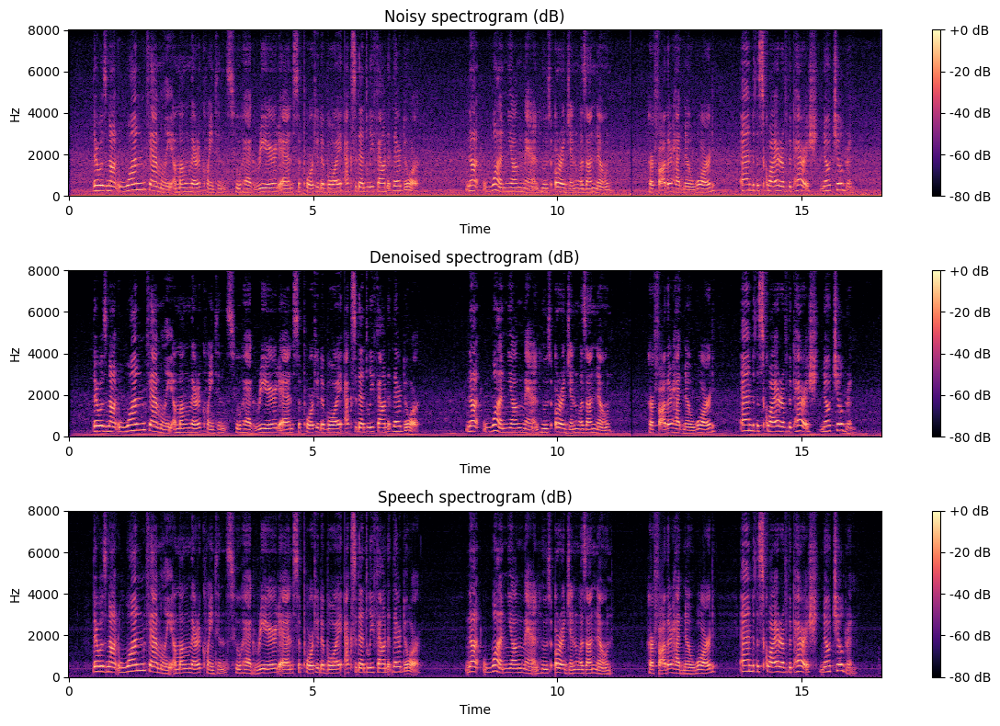

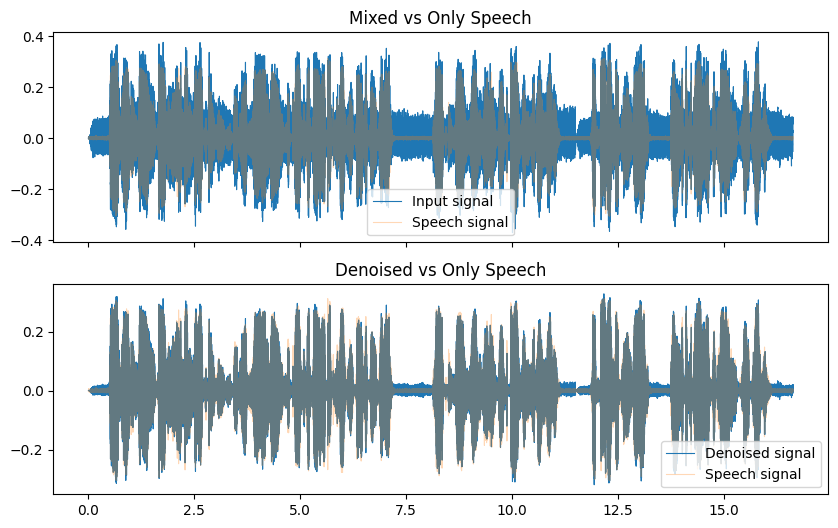

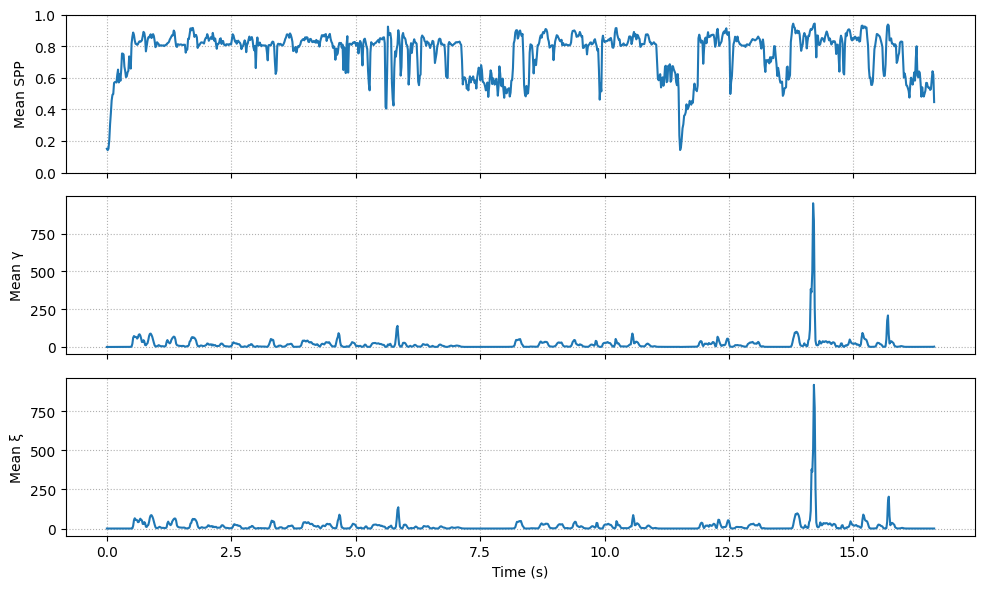

Original sound:


Denoised sound:


[DNSMOS]   input =   1.28    | output =   2.54    | Δdnsmos =   1.26
[PESQ]     input =   1.44    | output =   2.35    | Δpesq =   0.90
[SNR]      input =   3.00 dB | output =  13.36 dB | ΔSNR =  10.36 dB
[SegSNR]   input =  -1.40 dB | output =   6.51 dB | ΔSegSNR =   7.91 dB
{
  "BPF_Hz": 50.5,
  "RPM": 1010.0,
  "method": "welch",
  "sr": 44100,
  "blades": 3
}
[RPM] BPF≈50.50 Hz → RPM≈1010.0 (blades=3, method=welch)
[Saved] denoise_data/test-2-l31db.wav


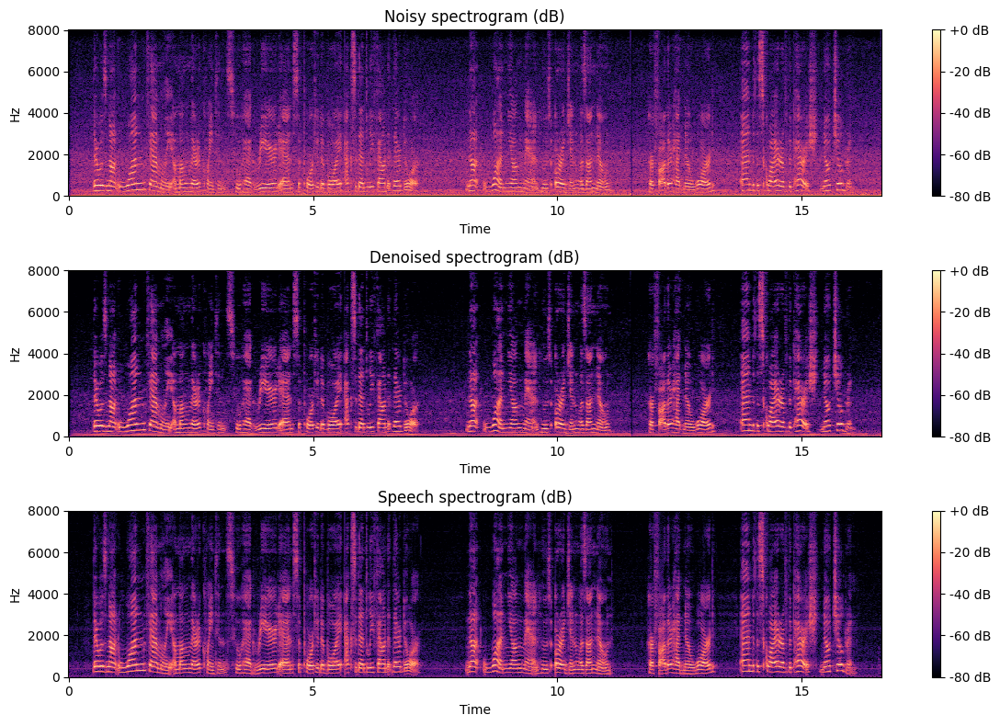

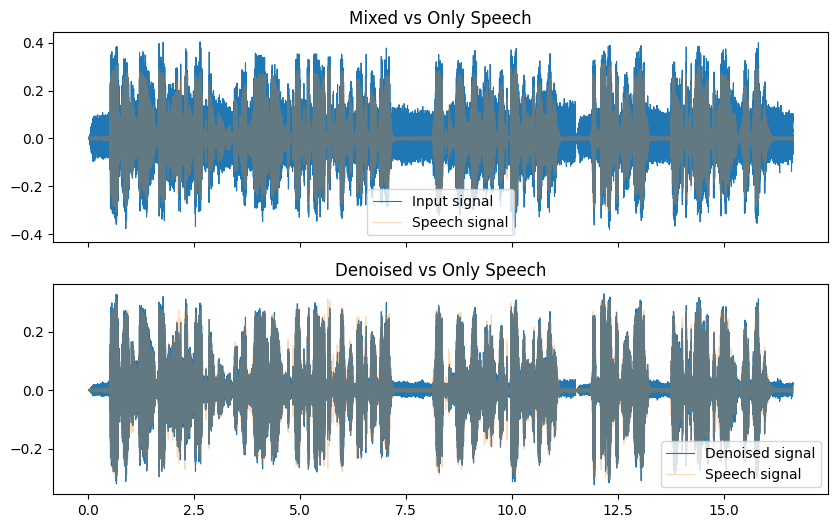

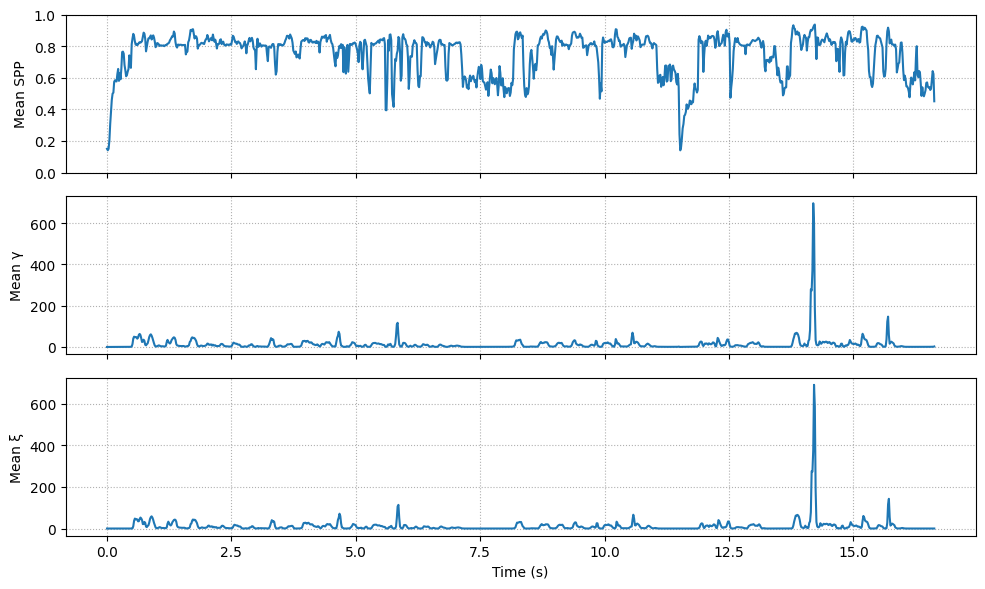

Original sound:


Denoised sound:


[DNSMOS]   input =   1.23    | output =   2.22    | Δdnsmos =   0.99
[PESQ]     input =   1.30    | output =   2.09    | Δpesq =   0.79
[SNR]      input =   1.00 dB | output =  11.50 dB | ΔSNR =  10.50 dB
[SegSNR]   input =  -2.80 dB | output =   4.98 dB | ΔSegSNR =   7.78 dB
{
  "BPF_Hz": 44.5,
  "RPM": 890.0,
  "method": "welch",
  "sr": 44100,
  "blades": 3
}
[RPM] BPF≈44.50 Hz → RPM≈890.0 (blades=3, method=welch)
[Saved] denoise_data/test-3-l2-2db.wav


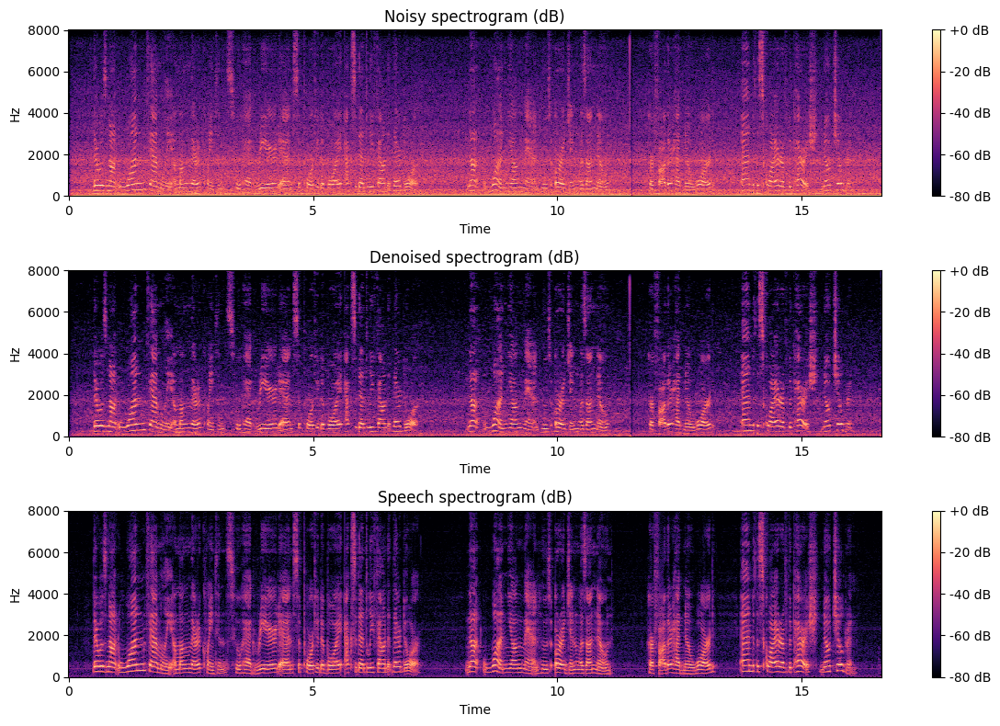

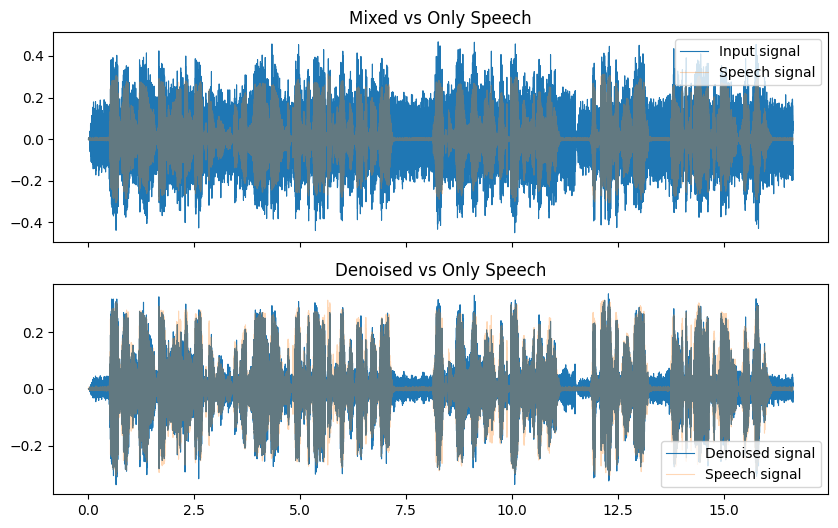

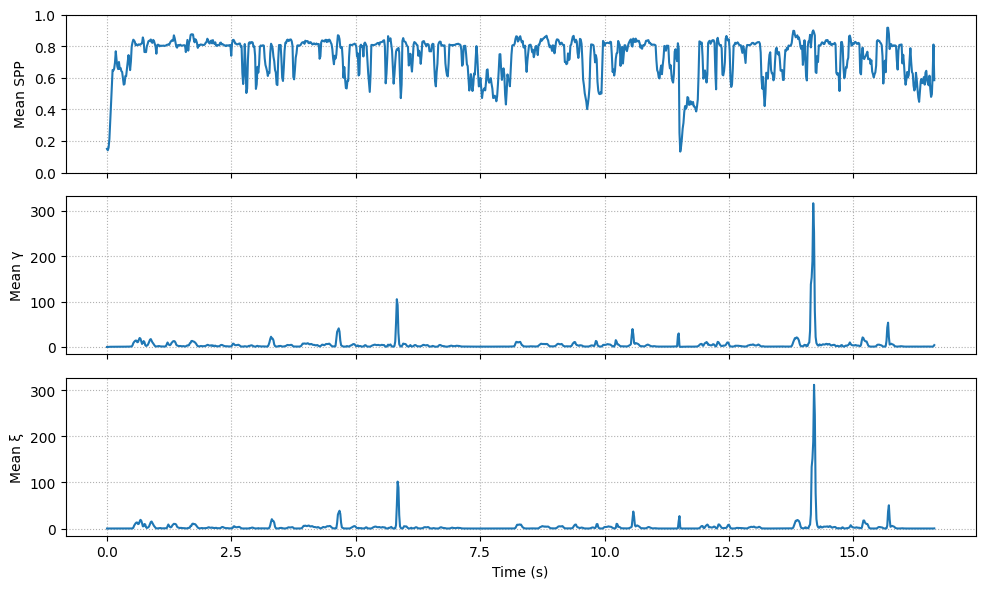

Original sound:


Denoised sound:


[DNSMOS]   input =   1.14    | output =   2.19    | Δdnsmos =   1.05
[PESQ]     input =   1.09    | output =   1.41    | Δpesq =   0.32
[SNR]      input =  -2.00 dB | output =   7.73 dB | ΔSNR =   9.73 dB
[SegSNR]   input =  -4.72 dB | output =   2.03 dB | ΔSegSNR =   6.75 dB
{
  "BPF_Hz": 38.0,
  "RPM": 760.0,
  "method": "welch",
  "sr": 44100,
  "blades": 3
}
[RPM] BPF≈38.00 Hz → RPM≈760.0 (blades=3, method=welch)
[Saved] denoise_data/test-4-l1-3db.wav


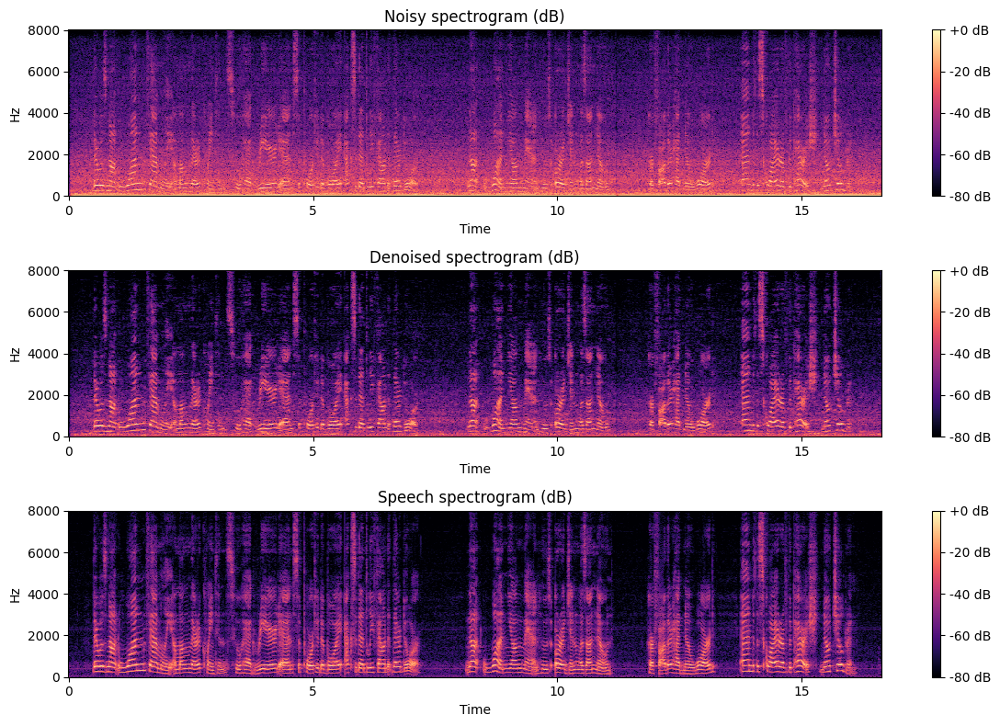

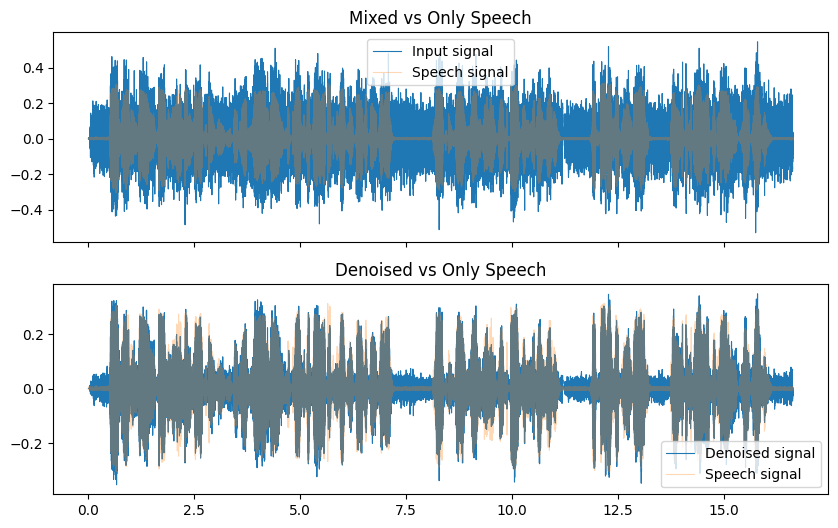

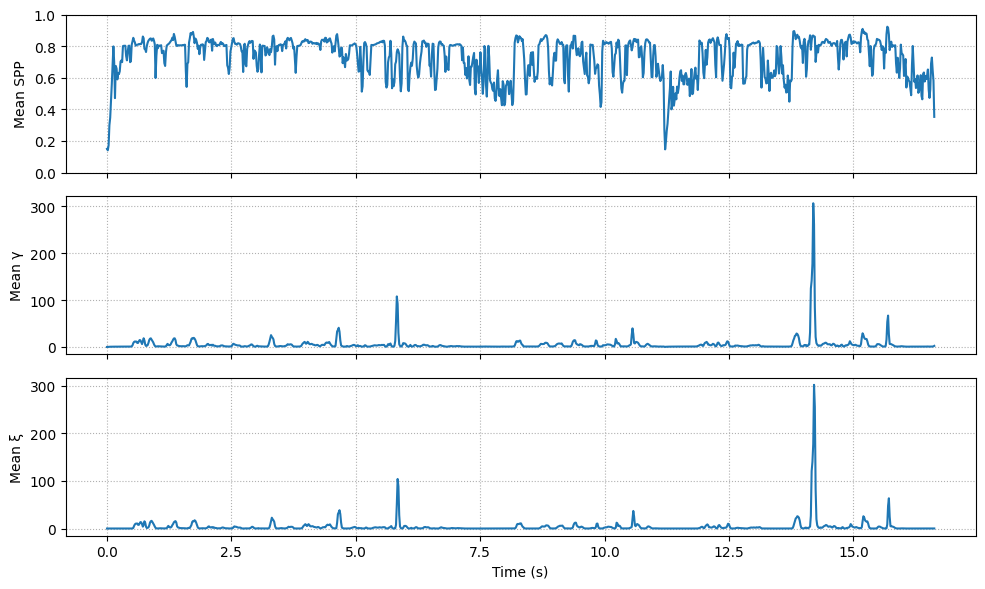

Original sound:


Denoised sound:


[DNSMOS]   input =   1.23    | output =   1.92    | Δdnsmos =   0.69
[PESQ]     input =   1.08    | output =   1.42    | Δpesq =   0.34
[SNR]      input =  -3.00 dB | output =   6.95 dB | ΔSNR =   9.95 dB
[SegSNR]   input =  -5.30 dB | output =   1.35 dB | ΔSegSNR =   6.65 dB


In [27]:
path=["test-1-l33db.wav","test-2-l31db.wav","test-3-l2-2db.wav","test-4-l1-3db.wav"]
level=[3,3,2,1]

for file,lev in zip(path,level):
    run_denoise(noisy_path="mix_data/"+file,file=file ,out_path="denoise_data/"+file,show_plots=True,fanonly_path=f"./sample-sound/fan{lev}-2.wav",blades=3)

    y_mix,  sr_m = load_mono_16k("mix_data/"+file)
    y_deno, sr_d = load_mono_16k("denoise_data/"+file)

    print("Original sound:")
    display(Audio(y_mix, rate=sr_m))

    print("Denoised sound:")
    display(Audio(y_deno, rate=sr_d))
    y_clean, sr_c = load_mono_16k("speech_data/"+file)
    y_noise, sr_n = load_mono_16k("noise_data/"+file)
    y_mix,  sr_m = load_mono_16k("mix_data/"+file)
    y_deno, sr_d = load_mono_16k("denoise_data/"+file)

    #dnmos score
    noisy_ovrl = score_dnsmos(y_mix,sr_m)
    denoise_ovrl = score_dnsmos(y_deno,sr_d)
    dnsmos_score = denoise_ovrl - noisy_ovrl
    #pesq score
    noisy_pesq = pesq(sr_c,y_clean,y_mix,'wb')
    denoised_pesq = pesq(sr_c,y_clean,y_deno,'wb')
    pesq_score = denoised_pesq - noisy_pesq
    # SNR
    input_snr = snr_db(y_clean, y_noise)
    residual = y_deno - y_clean
    output_snr = snr_db(y_clean, residual)
    delta_snr = output_snr - input_snr
    # Segmental SNRs 
    seg_input_snr = segmental_snr_db(y_clean, y_noise, sr_c)
    seg_output_snr = segmental_snr_db(y_clean, residual, sr_c)
    seg_delta_snr = seg_output_snr - seg_input_snr

    print(f"[DNSMOS]   input = {noisy_ovrl:6.2f}    | output = {denoise_ovrl:6.2f}    | Δdnsmos = {dnsmos_score:6.2f}")
    print(f"[PESQ]     input = {noisy_pesq:6.2f}    | output = {denoised_pesq:6.2f}    | Δpesq = {pesq_score:6.2f}")
    print(f"[SNR]      input = {input_snr:6.2f} dB | output = {output_snr:6.2f} dB | ΔSNR = {delta_snr:6.2f} dB")
    print(f"[SegSNR]   input = {seg_input_snr:6.2f} dB | output = {seg_output_snr:6.2f} dB | ΔSegSNR = {seg_delta_snr:6.2f} dB")


In [28]:
# y_clean, sr_c = load_mono_16k("aligned_speech.wav")
# y_noise, sr_n = load_mono_16k("aligned_noise.wav")
# y_mix,  sr_m = load_mono_16k("mixture.wav")
# y_deno, sr_d = load_mono_16k("denoised.wav")

# #dnmos score
# noisy_ovrl = score_dnsmos(y_mix,sr_m)
# denoise_ovrl = score_dnsmos(y_deno,sr_d)
# dnsmos_score = denoise_ovrl - noisy_ovrl
# #pesq score
# noisy_pesq = pesq(sr_c,y_clean,y_mix,'wb')
# denoised_pesq = pesq(sr_c,y_clean,y_deno,'wb')
# pesq_score = denoised_pesq - noisy_pesq
# # SNR
# input_snr = snr_db(y_clean, y_noise)
# residual = y_deno - y_clean
# output_snr = snr_db(y_clean, residual)
# delta_snr = output_snr - input_snr
# # Segmental SNRs 
# seg_input_snr = segmental_snr_db(y_clean, y_noise, sr_c)
# seg_output_snr = segmental_snr_db(y_clean, residual, sr_c)
# seg_delta_snr = seg_output_snr - seg_input_snr

# print(f"[DNSMOS]   input = {noisy_ovrl:6.2f}    | output = {denoise_ovrl:6.2f}    | Δdnsmos = {dnsmos_score:6.2f}")
# print(f"[PESQ]     input = {noisy_pesq:6.2f}    | output = {denoised_pesq:6.2f}    | Δpesq = {pesq_score:6.2f}")
# print(f"[SNR]      input = {input_snr:6.2f} dB | output = {output_snr:6.2f} dB | ΔSNR = {delta_snr:6.2f} dB")
# print(f"[SegSNR]   input = {seg_input_snr:6.2f} dB | output = {seg_output_snr:6.2f} dB | ΔSegSNR = {seg_delta_snr:6.2f} dB")


In [29]:
# for run the whole test file at once
# rows= []


# for level in range(1,4):
#     for db in range(-3,4):
#         mix_path = f"mix_data/ml_{level}_{db}dB.wav"
#         sp_path  = f"speech_data/sl_{level}_{db}dB.wav"
#         nz_path  =  f"noise_data/nl_{level}_{db}dB.wav"
#         den_path =  f"denoise_data/dl_{level}_{db}dB.wav"

#         run_denoise(mix_path, out_path=den_path,blades=3,fanonly_path=f"./sample-sound/fan{level}-2.wav",show_plots=False)

#         # --- Load waveforms ---
#         y_clean, sr_c = load_mono_16k(str(sp_path))
#         y_noise, sr_n = load_mono_16k(str(nz_path))
#         y_mix,  sr_m  = load_mono_16k(str(mix_path))
#         y_deno, sr_d  = load_mono_16k(str(den_path))


#         # --- Metrics: DNSMOS, PESQ, SNR, S2N ---
#         try:
#             noisy_dnsmos   = score_dnsmos(y_mix,  16000)
#             denoised_dnsmos= score_dnsmos(y_deno, 16000)
#             dnsmos_diff = denoised_dnsmos - noisy_dnsmos
#         except Exception as e:
#             print(f"DNSMOS failed for {mix_path.name}: {e}")
#             noisy_dnsmos = denoised_dnsmos = dnsmos_diff = np.nan

#         try:
#             # PESQ expects (fs, ref, deg, mode) and ref=clean speech
#             noisy_pesq    = pesq(16000, y_clean, y_mix,  'wb')
#             denoised_pesq = pesq(16000, y_clean, y_deno, 'wb')
#             pesq_diff = denoised_pesq - noisy_pesq
#         except Exception as e:
#             print(f"PESQ failed for {mix_path.name}: {e}")
#             noisy_pesq = denoised_pesq = pesq_diff = np.nan

#         # Classical power SNRs
#         in_snr_db  = snr_db(y_clean, y_noise)
#         residual   = y_deno - y_clean
#         out_snr_db = snr_db(y_clean, residual)
#         d_snr_db   = out_snr_db - in_snr_db

#         rows.append({
#             "level": level,
#             "db": int(db),
#             "mix_path": str(mix_path),
#             "speech_path": str(sp_path),
#             "noise_path": str(nz_path),
#             "denoised_path": str(den_path),

#             "dnsmos_noisy": noisy_dnsmos,
#             "dnsmos_deno": denoised_dnsmos,
#             "dnsmos_diff": dnsmos_diff,

#             "pesq_noisy": noisy_pesq,
#             "pesq_deno": denoised_pesq,
#             "pesq_diff": pesq_diff,

#             "snr_in_db": in_snr_db,
#             "snr_out_db": out_snr_db,
#             "snr_delta_db": d_snr_db,

#         })

# # ----------------- Results table & save -----------------

# df = pd.DataFrame(rows).sort_values(by=["level", "db"])
# csv_path = "./batch_metrics.csv"
# df.to_csv(csv_path, index=False)
# print(f"Saved metrics: {csv_path}")

# # Pretty table (Jupyter)
# try:
#     from IPython.display import display
#     display(df)
# except Exception:
#     print(df)

# # ----------------- Plots -----------------

# plt.figure(figsize=(10, 5))
# plt.title("ΔDNSMOS and ΔPESQ by case")
# idx = np.arange(len(df))
# plt.plot(idx, df["dnsmos_diff"].values, marker="o", label="ΔDNSMOS")
# plt.plot(idx, df["pesq_diff"].values,  marker="s", label="ΔPESQ")
# plt.xticks(idx, [f"{r.level}_{r.db}dB" for r in df.itertuples()], rotation=45, ha="right")
# plt.ylabel("Improvement")
# plt.grid(True, alpha=0.3)
# plt.legend()
# plt.tight_layout()
# plt.show()

# plt.figure(figsize=(10, 5))
# plt.title("SNR (in/out) and ΔSNR by case")
# plt.plot(idx, df["snr_in_db"].values,   marker=".", label="SNR_in (dB)")
# plt.plot(idx, df["snr_out_db"].values,  marker="^", label="SNR_out (dB)")
# plt.plot(idx, df["snr_delta_db"].values,marker="o", label="ΔSNR (dB)")
# plt.xticks(idx, [f"{r.level}_{r.db}dB" for r in df.itertuples()], rotation=45, ha="right")
# plt.ylabel("dB")
# plt.grid(True, alpha=0.3)
# plt.legend()
# plt.tight_layout()
# plt.show()
